In [3]:
import folium
import requests
import matplotlib.pyplot as plt
import json
import pandas as pd
import foursquare

In [3]:
places = ["14.73371, 121.06813", "14.73554, 121.01268", "14.72026, 120.96342", \
          "14.6922, 121.06212", "14.69037, 121.01732", "14.68954, 120.97063", \
          "14.65517, 121.05182", "14.65866, 121.01028", "14.64703, 120.9708", \
          "14.6364, 121.07414", "14.64819, 121.1174", "14.62361, 121.03998", \
          "14.61049, 120.9914", "14.60949, 121.10658", "14.60152, 121.05165", \
          "14.56946, 121.09491", "14.5776, 121.05972", "14.5771, 121.02865", \
          "14.5565, 121.02092", "14.55583, 121.02607", "14.55583, 121.02607", \
          "14.55002, 121.06126", "14.55002, 121.04581", "14.5241, 121.02127", \
          "14.47723, 121.02521", "14.44631, 121.00221", "14.40209, 121.02779",
          "14.40209, 121.02779", "14.60974, 121.08002", "14.64969, 121.0747"]
topics = ["fast food", "fastfood", "mcdo", "burger", "pizza", "chicken"]

In [4]:
len(places)

30

In [5]:
# Construct the client object
client = foursquare.Foursquare(client_id='LK0U2PMB3ZFV3DH03TKBF2H04KUBRHFOZOZNHP5NWOESAALM', 
                               client_secret='PKNTSEUE5L4T533TSRI4JTNND3KQTOLGJAZVTTFT5EU3HCU4', 
                               redirect_uri='http://fondu.com/oauth/authorize')

# Build the authorization url for your app
auth_uri = client.oauth.auth_url()

In [6]:
response = [client.venues.search(params={'query': topic, 
                                         'll': place,
                                        'radius': 2000,
                                        'limit': 30, 
                                        'intent': "browse", 
                                        'categoryId': '4d4b7105d754a06374d81259'})
            for place in places for topic in topics]

In [7]:
len(response)

180

In [9]:
data_list = []
for x in range(len(response)):
    try:
        for i in range(len(response[x]["venues"])):
            poi_id =  response[x]["venues"][i]["id"]
            poi_name =  response[x]["venues"][i]["name"]
            poi_lat =  response[x]["venues"][i]["location"]["lat"]
            poi_lng =  response[x]["venues"][i]["location"]["lng"]
            data_list.append([poi_id, poi_name, poi_lat, poi_lng])
    except KeyError:
        pass

df = pd.DataFrame(data_list, columns=["id", "name", "lat", "lng"])
df = df.drop_duplicates()
df["name"] = df['name'].str.lower()

In [129]:
df.to_csv("fastfood.csv")

In [5]:
df = pd.read_csv("data/fastfood.csv")

In [6]:
df.tail()

,Unnamed: 0,id,name,lat,lng
2640,3309,5620cf5f498e9e3170d3c2cb,"isko chicken wings, fish & mojos",14.659614,121.068498
2641,3312,51d54922498efa52e1a14cd8,chicken nook,14.659181,121.067216
2642,3313,54d9ace1498ea26cb12e022a,1920's fried chicken (old country kitchenette),14.659736,121.067953
2643,3321,59eea90016fa04120bacc9ba,hb fried chicken,14.642593,121.058972
2644,3324,4e8707e002d5fcc9af74effa,chic-boy,14.666094,121.071515


In [7]:
df.head()

,Unnamed: 0,id,name,lat,lng
0,0,53a29eff498e6bc264a2f746,zeny's fast food,14.737028,121.051134
1,1,50a4b924e4b0cbb1fac2abd1,sm city fairview food court,14.734662,121.059471
2,2,4d294f6c888af04da15eceaf,bodhi vegetarian health food house,14.733963,121.060023
3,3,58dfc03b076be155f2ac96e4,rooftop food park,14.730262,121.060988
4,4,5800d3e738fa52c570ae707c,bodega food hub,14.728601,121.060421


In [8]:
df[df["name"].str.contains("jolli")]

,Unnamed: 0,id,name,lat,lng
1588,1633,4d690e02de28224b27ee3dbe,jolliant fast food,14.579475,121.056468
1858,1949,4cdf88b77e2e236a6576861b,jollibee,14.558926,121.005496


<AxesSubplot:title={'center':'Top 20 Fastfood by Number of Branches'}>

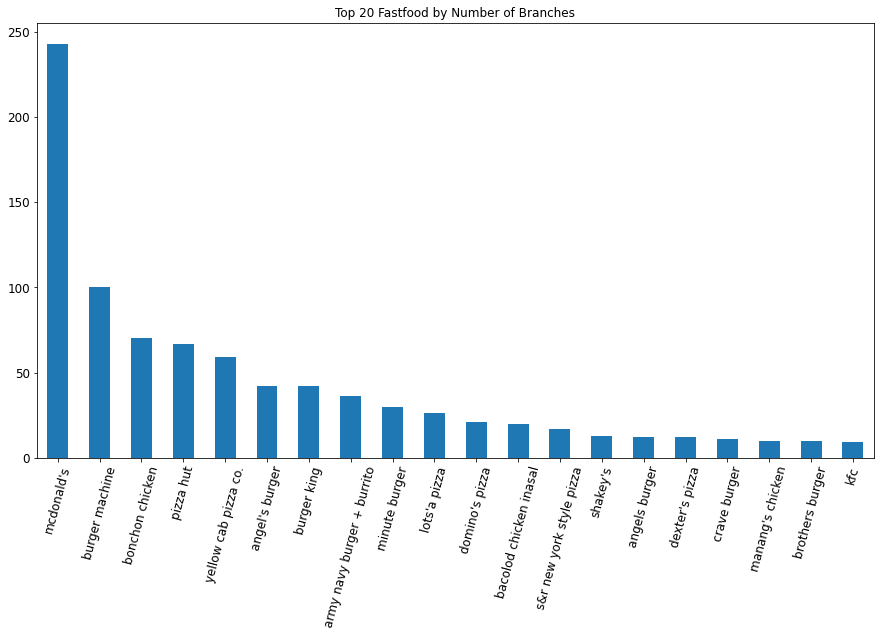

In [9]:
fig, ax = plt.subplots()
df['name'].value_counts().head(20).plot(ax=ax, kind='bar', \
                                        title ="Top 20 Fastfood by Number of Branches",figsize=(15,8), fontsize=12, rot=75)

In [10]:
basemap = folium.Map(location=[14.5562297,121.0204097], tiles="cartodbpositron", zoom_start=15)

for index, row in df.iterrows():
    folium.CircleMarker([row["lat"], row["lng"]], radius=5,
        popup = folium.Popup(str(row["lat"]) + " " + str(row["lng"]), parse_html=True),
    fill=True).add_to(basemap)
    
basemap.save('fastfood.html')

basemap

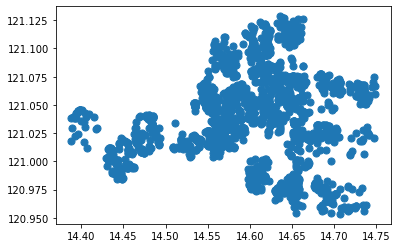

In [11]:
import numpy as np

X = np.array(df[["lat", "lng"]].values.tolist())
plt.scatter(X[:, 0], X[:, 1], s=50)

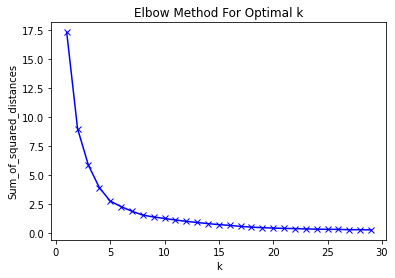

In [12]:
from sklearn.cluster import KMeans


sum_of_squared_distances = []
K = range(1,30)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(X)
    sum_of_squared_distances.append(km.inertia_)

plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

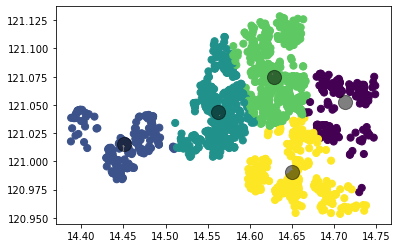

In [13]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

In [14]:
import seaborn as sns

df["kmeans_cluster"] = y_kmeans
palette = sns.color_palette("pastel", 5).as_hex()
color_getter = lambda x: palette[int(x)]
df["k_color"] = df["kmeans_cluster"].map(color_getter)
df.head()

,Unnamed: 0,id,name,lat,lng,kmeans_cluster,k_color
0,0,53a29eff498e6bc264a2f746,zeny's fast food,14.737028,121.051134,0,#a1c9f4
1,1,50a4b924e4b0cbb1fac2abd1,sm city fairview food court,14.734662,121.059471,0,#a1c9f4
2,2,4d294f6c888af04da15eceaf,bodhi vegetarian health food house,14.733963,121.060023,0,#a1c9f4
3,3,58dfc03b076be155f2ac96e4,rooftop food park,14.730262,121.060988,0,#a1c9f4
4,4,5800d3e738fa52c570ae707c,bodega food hub,14.728601,121.060421,0,#a1c9f4


In [17]:
basemap = folium.Map(location=[14.5562297,121.0204097], tiles="cartodbdark_matter", zoom_start=15)
    
for index, row in df.iterrows():
    folium.CircleMarker([row["lat"], row["lng"]], radius=5, fill=True,
    color =row["k_color"], fill_color=row["k_color"], popup = folium.Popup(str(row["lat"]) + " " + str(row["lng"]), parse_html=True)
    ).add_to(basemap)

basemap

In [18]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=0.005, min_samples=5).fit(X)
y_dbscan = dbscan.labels_

In [19]:
y_dbscan

array([ 0,  0,  0, ..., 13, 13, 13])

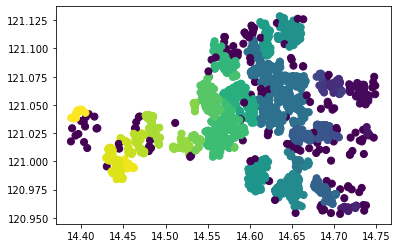

In [20]:
plt.scatter(X[:, 0], X[:, 1], c=y_dbscan, s=50, cmap='viridis')

In [21]:
df["dbscan_cluster"] = y_dbscan
palette = sns.color_palette("pastel", len(y_dbscan)).as_hex()
color_getter = lambda x: palette[int(x)]
df["db_color"] = df["dbscan_cluster"].map(color_getter)
df.head()

,Unnamed: 0,id,name,lat,lng,kmeans_cluster,k_color,dbscan_cluster,db_color
0,0,53a29eff498e6bc264a2f746,zeny's fast food,14.737028,121.051134,0,#a1c9f4,0,#a1c9f4
1,1,50a4b924e4b0cbb1fac2abd1,sm city fairview food court,14.734662,121.059471,0,#a1c9f4,0,#a1c9f4
2,2,4d294f6c888af04da15eceaf,bodhi vegetarian health food house,14.733963,121.060023,0,#a1c9f4,0,#a1c9f4
3,3,58dfc03b076be155f2ac96e4,rooftop food park,14.730262,121.060988,0,#a1c9f4,0,#a1c9f4
4,4,5800d3e738fa52c570ae707c,bodega food hub,14.728601,121.060421,0,#a1c9f4,0,#a1c9f4


In [24]:
df = df[df["dbscan_cluster"] > -1]

In [25]:
basemap = folium.Map(location=[14.5562297,121.0204097], tiles="cartodbdark_matter", zoom_start=15)

for index, row in df.iterrows():
    folium.CircleMarker([row["lat"], row["lng"]], radius=5, fill=True,
    color =row["db_color"], fill_color=row["db_color"], popup = folium.Popup(str(row["lat"]) + " " + str(row["lng"]), parse_html=True)
    ).add_to(basemap)

basemap